In [1]:
# Import necessary packages
import numpy as np
import matplotlib.pyplot as plt
from tifffile import imread
from scipy.ndimage import gaussian_filter
import kemstem
import kemstem.extensions.ruddlesden_popper as RP
%matplotlib widget

# Loading image
First we'll need to load our STEM image. Registered images work best, but most images with atomic resolution should work.

Image shape (1024, 1024)
Cropped to (1024, 1024)
Normalized to min: 0.0, max: 1.0


(-0.5, 1023.5, 1023.5, -0.5)

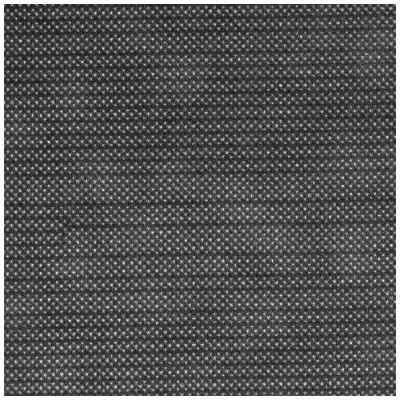

In [2]:
filename = '/Users/noahschnitzer/Downloads/27_SRO_5-1Mx_12us_1024px.tif'
image = imread(filename)
print(f'Image shape {image.shape}')
image = image[:min(image.shape),:min(image.shape)]
print(f'Cropped to {image.shape}')
image = kemstem.util.normalize(image)
print(f'Normalized to min: {image.min()}, max: {image.max()}')

fig,ax = plt.subplots(1,1,constrained_layout=True,figsize=(4,4))
ax.matshow(image,cmap='gray')
ax.axis('off')

(-0.5, 1023.5, 1023.5, -0.5)

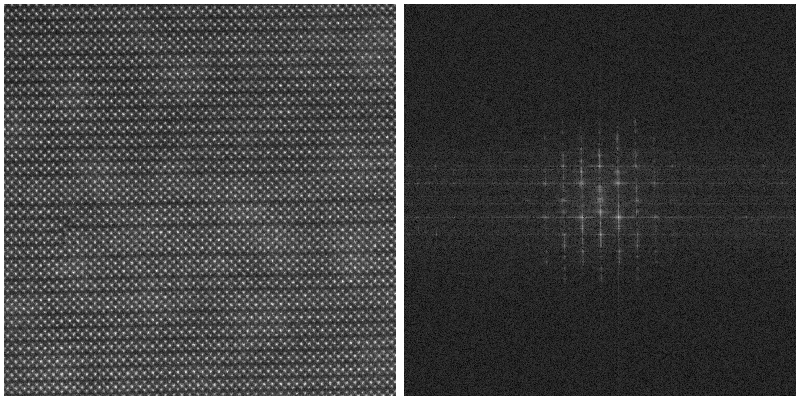

In [3]:
pattern_c = kemstem.fourier.prepare_fourier_pattern(image)
pattern_log = kemstem.fourier.prepare_fourier_pattern(image,log=True,log_offset=1e1) # Here we also take a log transform of the FFT for ease of visualization

fig,ax = plt.subplots(1,2,constrained_layout=True,figsize=(8,4))
ax[0].matshow(image,cmap='gray')
ax[0].axis('off')
ax[1].matshow(pattern_log,cmap='gray')
ax[1].axis('off')

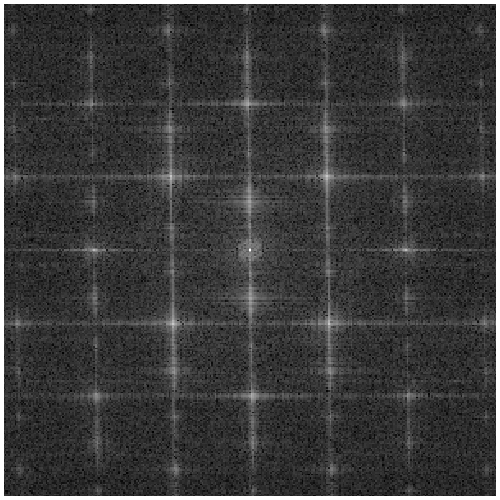

In [4]:
selected_peaks = kemstem.fourier.select_peaks(pattern_log,zoom=150,select_conjugates=False,figsize=(5,5),delete_within=5)

In [5]:
# uncomment and run to use preselected peak(s)
selected_peaks = np.array([[601.2128707453212, 513.2256758235744]]).T

Selected X positions: [513.22567582]
Selected Y positions: [601.21287075]


100%|████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 90.22it/s]


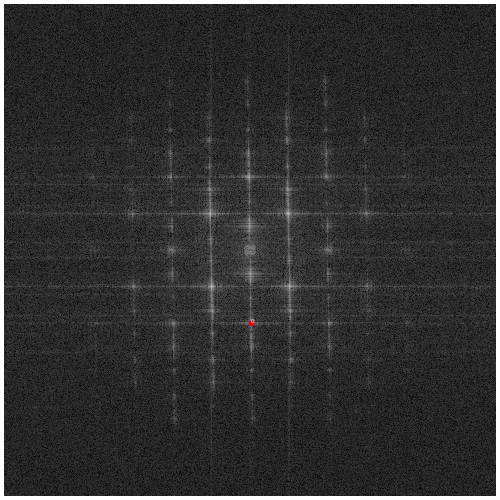

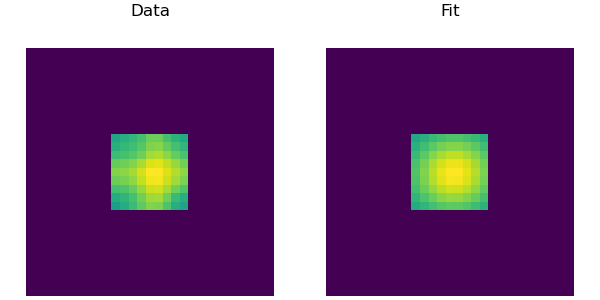

In [6]:
p0 = np.array(selected_peaks).T
print(f'Selected X positions: {p0[:,1]}')
print(f'Selected Y positions: {p0[:,0]}')

peaks_ref,errs,opts,data_fits  = kemstem.fourier.refine_peaks_gf(gaussian_filter(pattern_log,1), p0, window_dimension=9,store_fits=True, remove_unfit = False)
fig,ax = plt.subplots(1,1,constrained_layout=True,figsize=(5,5))
kemstem.util.plot_numbered_points(pattern_log,p0,ax=ax,color='b',zoom=300)
ax.plot(peaks_ref[:,1],peaks_ref[:,0],'r.')
ax.axis('off')

_ = kemstem.util.plot_fit_comparison(data_fits,)

In [7]:
peaks_ref = np.array([[601.2128707453212, 513.2256758235744]])

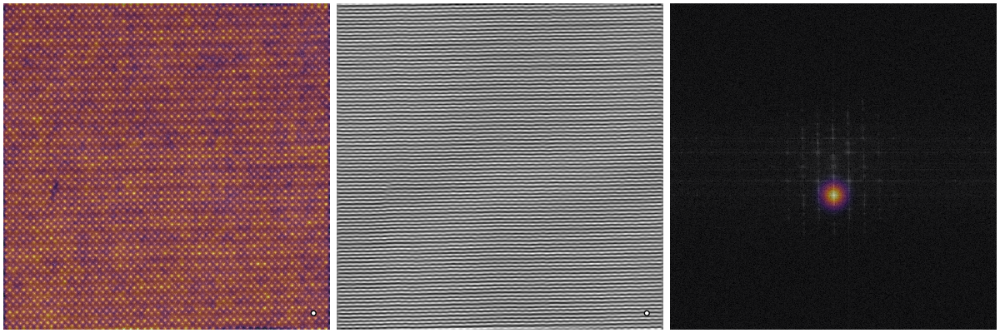

In [8]:
peak_index = 0
sigma= 25
filtered_im, filtered_ft, mask = kemstem.fourier.fourier_filter(pattern_c,peaks_ref[peak_index,:],sigma=sigma)

fig,ax = plt.subplots(1,3,constrained_layout=True,figsize=(12,4))
ax[0].matshow(image,cmap='gray')
ax[0].matshow(np.abs(filtered_im),cmap='inferno',alpha=.5)
ax[0].axis('off')
ax[1].matshow(np.real(filtered_im),cmap='gray')
ax[1].axis('off')
ax[2].matshow(pattern_log,cmap='gray')
ax[2].matshow(mask,alpha=.5,cmap='inferno')
ax[2].axis('off')

kemstem.util.coarsening_marker(ax[0],kemstem.fourier.coarsening_length(image.shape[0],sigma),edgecolor='k',facecolor='w')
kemstem.util.coarsening_marker(ax[1],kemstem.fourier.coarsening_length(image.shape[0],sigma),edgecolor='k',facecolor='w')

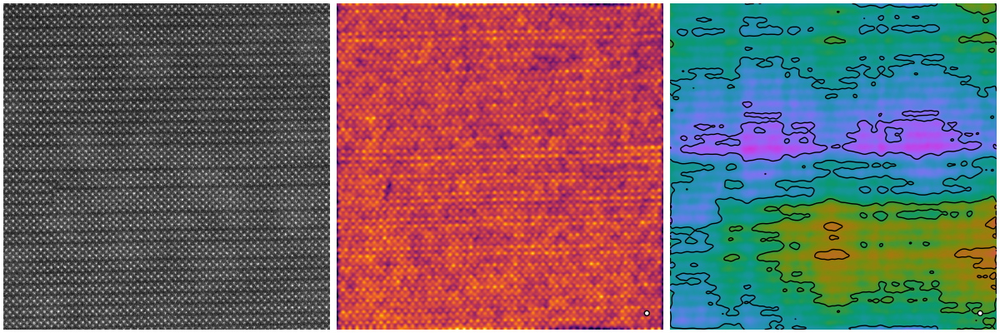

In [9]:
phase = kemstem.fourier.phaselock(filtered_im,peaks_ref[peak_index,:],sigma=25) # different from the sigma above 
# this sigma is a parameter of the lock in analysis and should generally be larger than the sigma used for Fourier filtering
# but should not need to be changed here

fig,ax = plt.subplots(1,3,constrained_layout=True,figsize=(12,4))

ax[0].matshow(image,cmap='gray')
ax[0].axis('off')
ax[1].matshow(np.abs(filtered_im),cmap='inferno')
ax[1].axis('off')
kemstem.util.plot_phase(phase,ax=ax[2])
ax[2].axis('off')

kemstem.util.coarsening_marker(ax[1],kemstem.fourier.coarsening_length(image.shape[0],sigma),edgecolor='k',facecolor='w')
kemstem.util.coarsening_marker(ax[2],kemstem.fourier.coarsening_length(image.shape[0],sigma),edgecolor='k',facecolor='w',zorder=2)

(-0.5, 1023.5, 1023.5, -0.5)

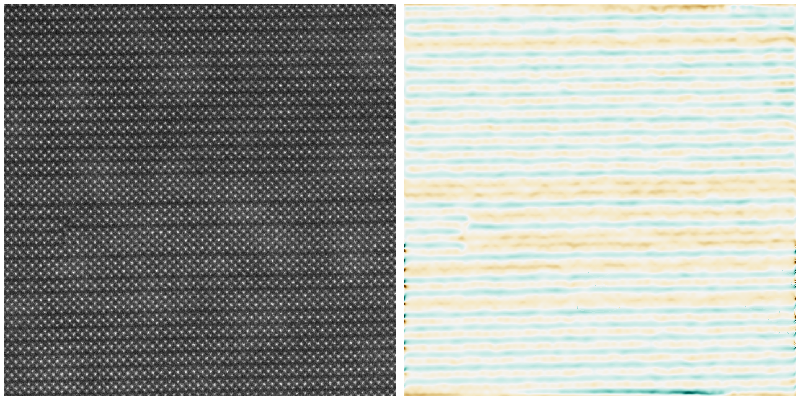

In [10]:
# strain
sv = .3

ref_x = peaks_ref[peak_index,1]-image.shape[0]/2. 
ref_y = peaks_ref[peak_index,0]-image.shape[0]/2. 
eps_par, eps_trans = kemstem.fourier.phase_to_strain(phase, ref_x, ref_y, mask_threshold=1.)
fig,ax = plt.subplots(1,2,constrained_layout=True,figsize=(8,4),sharex=True,sharey=True)
ax[0].matshow(image,cmap='gray')
ax[0].axis('off')
ax[1].matshow(eps_par,cmap='BrBG',vmin=-sv,vmax=sv)
ax[1].axis('off')

In [11]:
##parameters for RP mapping

In [68]:
angle = np.arctan2(*(peaks_ref-image.shape[0]/2).flatten()[::-1].tolist()) # Defines angle of sample
px_scale = np.linalg.norm(peaks_ref-np.array(image.shape)/2)/(2*image.shape[0]) # units uc/px

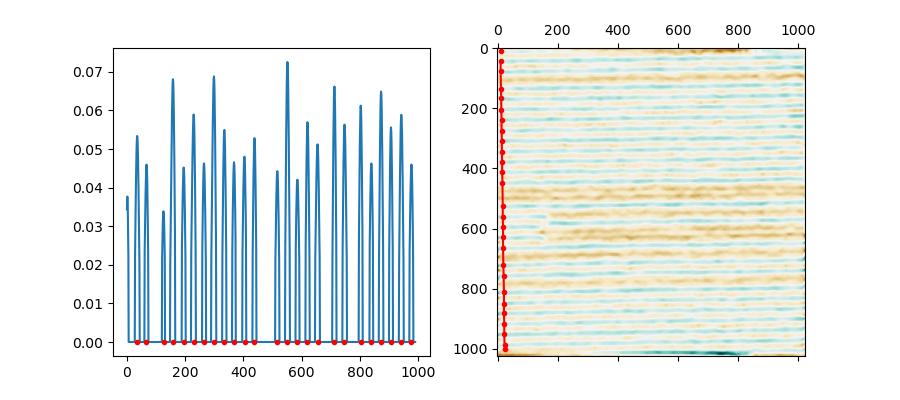

In [70]:
## for checking

x0 = 10
x1 = eps_par.shape[0] - 15
y0= 10
y1 = eps_par.shape[0] - 25

_=RP.find_RP(eps_par,angle, x0,x1,y0,y1,threshold=0.02, width_peak= 1/(4*px_scale),linewidth = int(1/(px_scale)), distance = 1/px_scale, vis=True)

In [71]:
spacing = 1 
scale = int(spacing/px_scale) 
xrange = np.arange(x0,x1,scale)

RPs=[]
for i in xrange:
    xyp = RP.find_RP(eps_par,angle,i,x1,y0,y1,threshold=0.02, width_peak= 1/(4*px_scale),linewidth = int(1/(px_scale)), distance = 1/px_scale,vis=False)
    RPs.append(np.array(xyp))

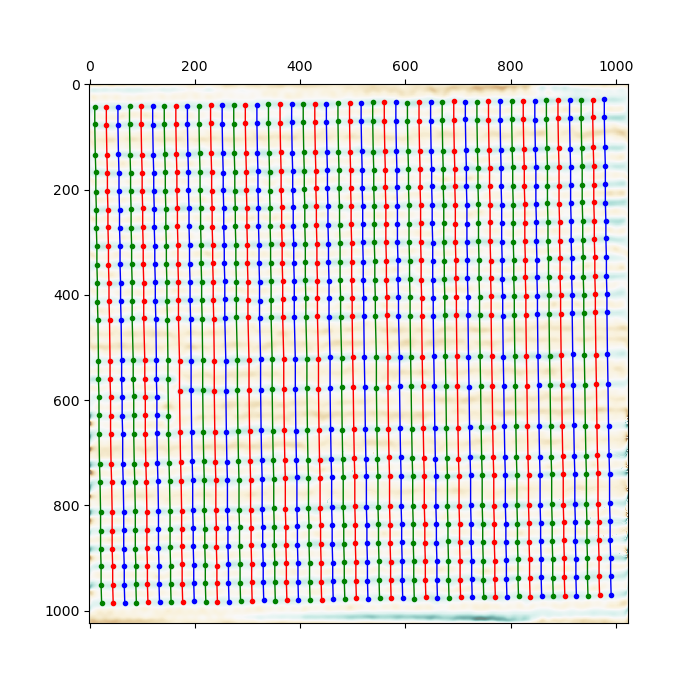

In [72]:
color = ['go-','ro-','bo-']
fig, ax =plt.subplots(1, figsize=(7,7), sharex=True, sharey=True)
c_im0 = ax.matshow(eps_par, vmin=-0.25, vmax=0.25, cmap='BrBG', alpha = 0.6)
for i in range(len(RPs)-1):                
    ax.plot(RPs[i][:,1], RPs[i][:,0], color[np.mod(i,3)] ,linewidth = 1, markersize = 3)

In [73]:
UC_dist,bond_coordinates = RP.measure_distances(RPs,px_scale)
bond_coordinates = np.array(bond_coordinates)

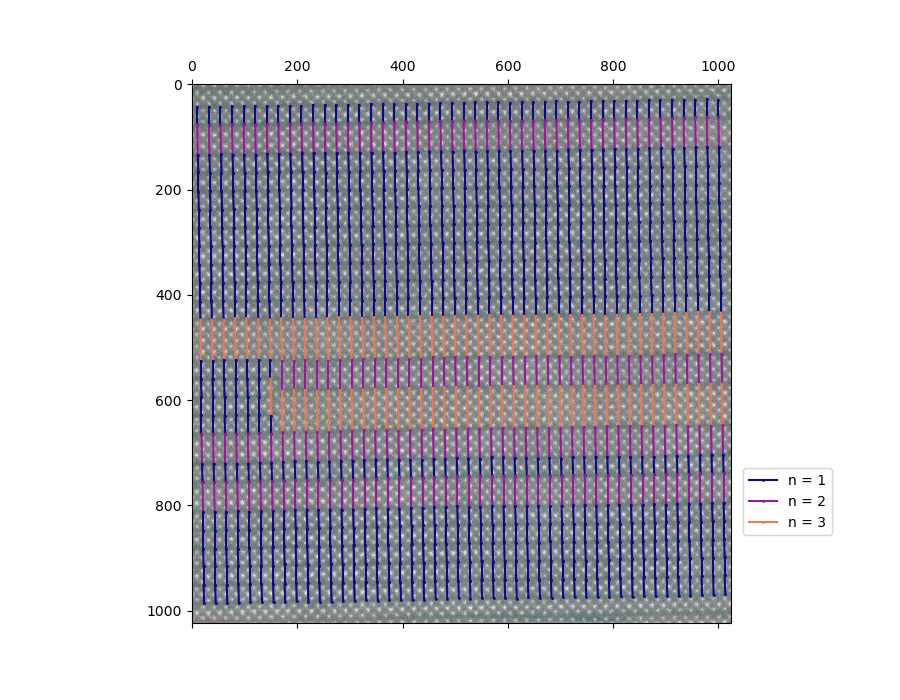

In [74]:
fig, ax =plt.subplots(1, figsize=(9,7), sharex=True, sharey=True)
colors= RP.vis_bond(ax,image,eps_par,UC_dist,bond_coordinates,cmap='plasma')

[1 2 3]
[762 177  86]


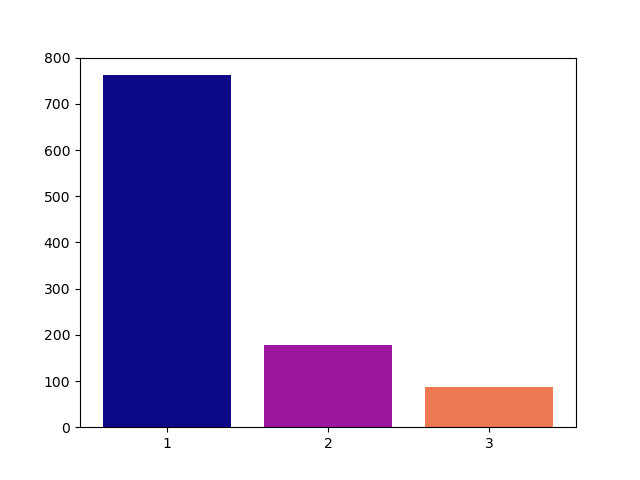

In [75]:
fig,ax = plt.subplots()
RP.vis_hist(ax,UC_dist,colors)

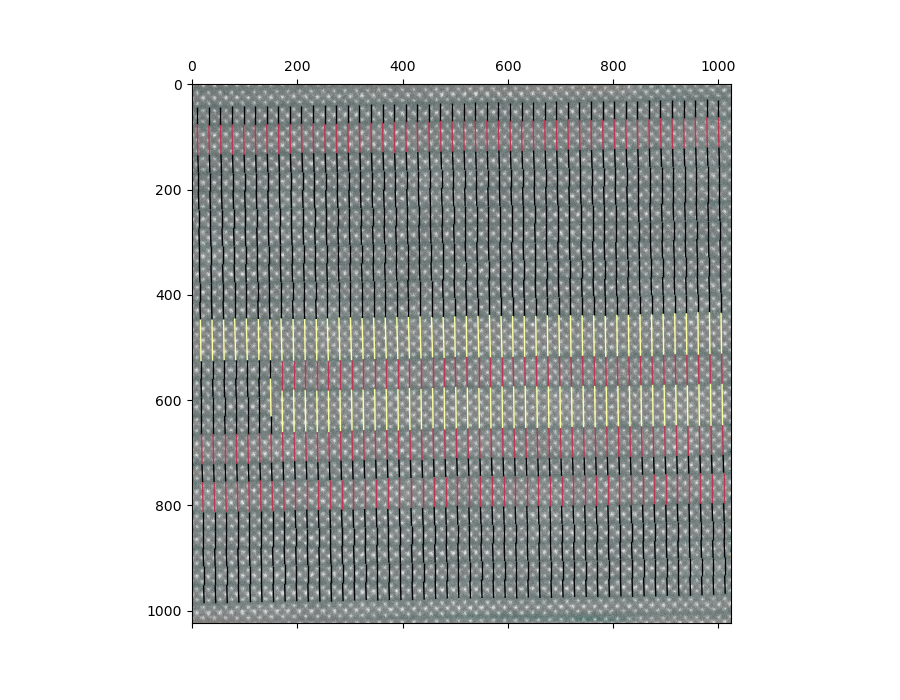

In [76]:
## can also use the inbuilt plot_scalar_bonds to plot the code
fig, ax =plt.subplots(1, figsize=(9,7), sharex=True, sharey=True)
c_im00=ax.matshow(image, cmap='gray')
c_im0 = ax.matshow(eps_par, cmap='BrBG',alpha=0.4)
kemstem.util.viz.plot_scalar_bonds(ax,UC_dist,bond_coordinates[:,::-1,0],bond_coordinates[:,::-1,1])